In [ ]:
!pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! mkdir ~/.kaggle

In [ ]:
#! cp kaggle.json ~/.kaggle/

In [ ]:
!cp /content/kaggle.json  ~/.kaggle/kaggle.json

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d ninadaithal/imagesoasis

Dataset URL: https://www.kaggle.com/datasets/ninadaithal/imagesoasis
License(s): apache-2.0
 99% 1.21G/1.23G [00:04<00:00, 343MB/s]
100% 1.23G/1.23G [00:04<00:00, 315MB/s]


In [ ]:
!unzip imagesoasis.zip -d /content/dataset/

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_102.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_103.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_104.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_105.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_106.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_107.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_108.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_109.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_110.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_111.jpg  
  inflating: /content/dataset/Data/Very mild Dementia/OAS1_0247_MR1_mpr-4_112.jpg  
  inflating: /content/dat

In [ ]:
# Importing packages

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import re
import os
import random
import tensorflow as tf
import plotly.express as px

from keras.models import Sequential
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, average_precision_score, confusion_matrix, roc_auc_score, f1_score, confusion_matrix, precision_recall_fscore_support
from tensorflow.keras.applications import EfficientNetB0, EfficientNetV2B1
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import clone_model
from matplotlib.colors import LogNorm, LinearSegmentedColormap
from PIL import Image
from scipy.stats import skew
from tqdm import tqdm

In [ ]:
# Four categories
non_demented = []
very_mild_demented = []
mild_demented = []
moderate_demented = []

# Download per category
for dirname, _, filenames in os.walk('/content/dataset/Data/Non Demented'):
    for filename in filenames:
        non_demented.append(os.path.join(dirname, filename))

for dirname, _, filenames in os.walk('/content/dataset/Data/Very mild Dementia'):
    for filename in filenames:
        very_mild_demented.append(os.path.join(dirname, filename))

for dirname, _, filenames in os.walk('/content/dataset/Data/Mild Dementia'):
    for filename in filenames:
        mild_demented.append(os.path.join(dirname, filename))

for dirname, _, filenames in os.walk('/content/dataset/Data/Moderate Dementia'):
    for filename in filenames:
        moderate_demented.append(os.path.join(dirname, filename))

In [ ]:
# How many samples in each category:
print(len(non_demented))
print(len(very_mild_demented))
print(len(mild_demented))
print(len(moderate_demented))

67222
13725
5002
488


Visualizing Images

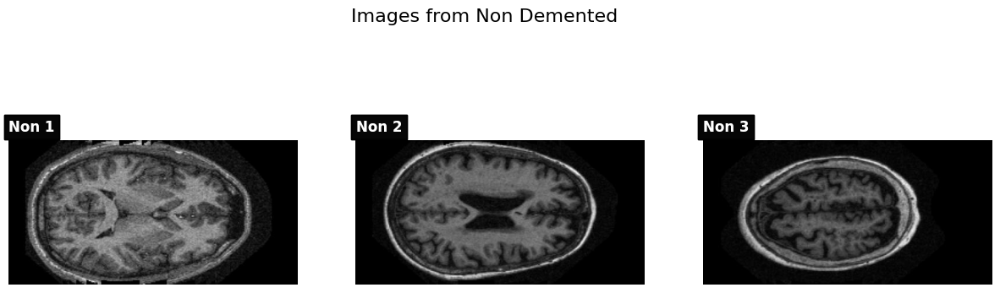

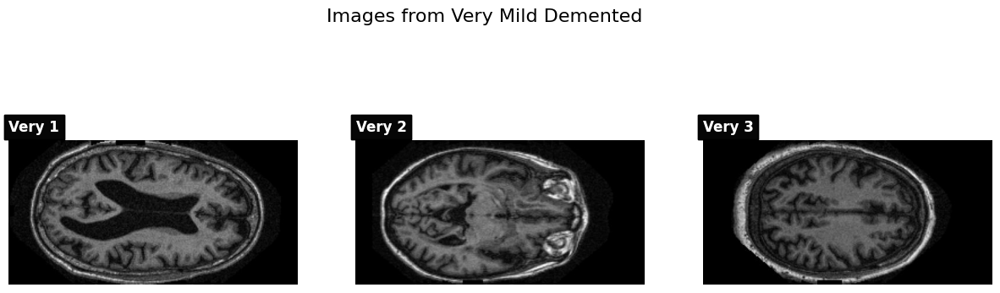

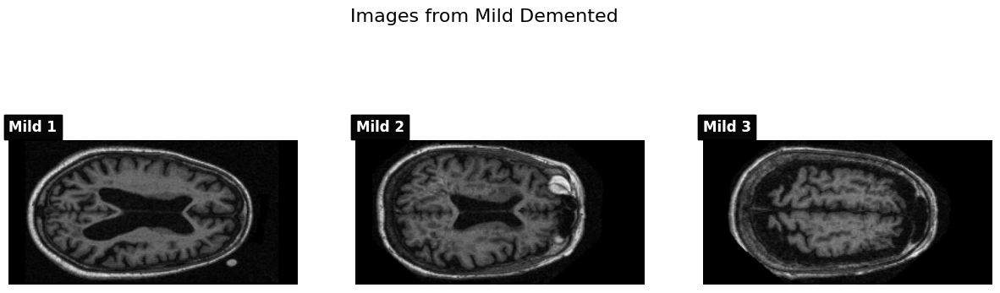

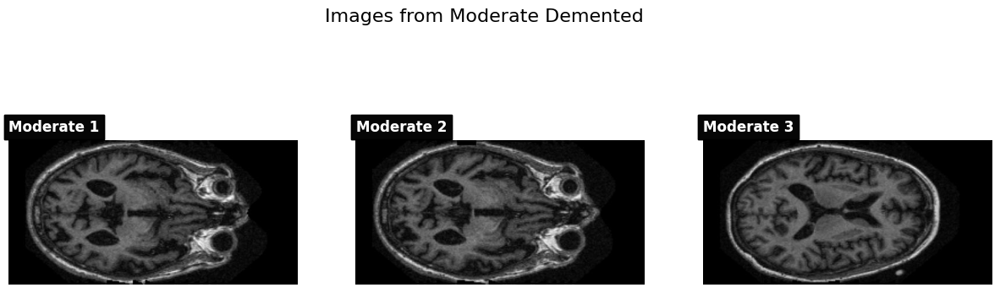

In [ ]:
# Function to display images with text indicating the category
def display_images_with_text(file_paths, category_name, endings=['150', '151', '152']):
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Images from {category_name}", fontsize=16)

    for ending in endings:
        matching_files = [img for img in file_paths if img.endswith(ending + '.jpg')]
        for i in range(min(3, len(matching_files))):
            img_path = matching_files[i]
            img = Image.open(img_path)
            plt.subplot(1, 3, i + 1)
            plt.imshow(img)
            plt.axis('off')

            # Add text indicating the category
            plt.text(0, -10, f"{category_name.split()[0]} {i + 1}", color='white', fontsize=12, weight='bold', ha='left', va='bottom', bbox=dict(facecolor='black', alpha=0.7))

    plt.show()

# Display images with text for each category
display_images_with_text(non_demented, "Non Demented")
display_images_with_text(very_mild_demented, "Very Mild Demented")
display_images_with_text(mild_demented, "Mild Demented")
display_images_with_text(moderate_demented, "Moderate Demented")

Exploratory Data Analysis (EDA)

In [ ]:
def get_info_from_filename(filename):
    pattern = re.compile('OAS1_(\d+)_MR(\d+)_mpr-(\d+)_(\d+).jpg')
    match = pattern.match(filename)
    patient_id = match.group(1)
    mr_id = match.group(2)
    scan_id = match.group(3)
    layer_id = match.group(4)

    return patient_id, mr_id, scan_id, layer_id

In [ ]:
def create_ref_df(dataset_path):
    paths, labels = [], []
    patient_ids, mr_ids, scan_ids, layer_ids = [], [], [], []

    # Iterate through folders in the dataset_path
    for folder in os.listdir(dataset_path):

        # Iterate through files in each folder
        for file in os.listdir(os.path.join(dataset_path, folder)):

            # Extract information from the filename using get_info_from_filename function
            patient_id, mr_id, scan_id, layer_id = get_info_from_filename(file)

            # Append information to respective lists
            paths.append(os.path.join(dataset_path, folder, file))
            labels.append(folder)
            patient_ids.append(patient_id)
            mr_ids.append(mr_id)
            scan_ids.append(scan_id)
            layer_ids.append(layer_id)

    # Create a DataFrame from the collected information
    ref_df = pd.DataFrame({
        'path': paths,
        'label': labels,
        'patient_id': patient_ids,
        'mr_id': mr_ids,
        'scan_id': scan_ids,
        'layer_id': layer_ids
    })

    # Convert columns to appropriate data types
    ref_df = ref_df.astype({
        'path': 'string',
        'label': 'string',
        'patient_id': 'int64',
        'mr_id': 'int64',
        'scan_id': 'int64',
        'layer_id': 'int64'
    })

    return ref_df

In [ ]:
# Applying the function defined above
ref_df = create_ref_df('/content/dataset/Data')

In [ ]:
def load_images(ref_df):
    labels = []
    images = []
    paths = []

    # Iterate through rows of the reference DataFrame
    for idx, row in tqdm(ref_df.iterrows(), total=ref_df.shape[0]):

        # Load image using PIL and convert it to a grayscale numpy array
        images.append(np.array(Image.open(row['path']).convert('L')))

        # Append label and path to respective lists
        labels.append(row['label'])
        paths.append(row['path'])

    # Return lists of images, labels, and paths
    return images, labels, paths

In [ ]:
# Applying the function defined above
images, labels, paths = load_images(ref_df)

100%|██████████| 86437/86437 [01:37<00:00, 887.93it/s]


In [ ]:
def get_image_stats(images, labels, paths):
    means, stds, widths, heights = [], [], [], []
    skewnesses = []

    # Iterate through the images
    for image in tqdm(images):

        # Calculate mean and standard deviation
        means.append(np.mean(image))
        stds.append(np.std(image))

        # Get image width and height
        widths.append(image.shape[0])
        heights.append(image.shape[1])

        # Calculate skewness of the image histogram
        image_hist = np.histogram(image.flatten())[0]
        skewnesses.append(skew(image_hist))

    # Create a DataFrame with image statistics
    image_stats = pd.DataFrame({
        'mean': means,
        'std': stds,
        'width': widths,
        'height': heights,
        'skew': skewnesses
    })

    # Add labels and paths to the DataFrame
    image_stats['label'] = labels
    image_stats['path'] = paths

    return image_stats

In [ ]:
# Applying the function defined above
image_stats = get_image_stats(images, labels, paths)

100%|██████████| 86437/86437 [03:49<00:00, 376.09it/s]


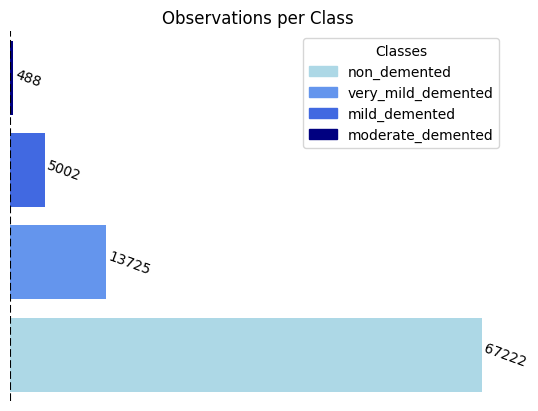

In [ ]:
# Defining class_names, frequencies
frequencies = [len(non_demented),  len(very_mild_demented), len(moderate_demented), len(mild_demented),]
class_names = ["non_demented", "very_mild_demented", "moderate_demented", "mild_demented"]

# Sorting class_names and frequencies in descending order
sorted_indices = np.argsort(frequencies)[::-1]
class_names = np.array(class_names)[sorted_indices]
frequencies = np.array(frequencies)[sorted_indices]

# Navy blue gradient color palette with 4 distinct colors
navy_blue_palette = LinearSegmentedColormap.from_list("navy_blue_palette", ["lightblue", "cornflowerblue", "royalblue", "navy"], N=4)

# Bar plot with adjusted y-axis limits and navy blue gradient colors
fig, ax = plt.subplots()
bp = ax.barh(np.arange(len(class_names)), frequencies, color=navy_blue_palette(np.linspace(0, 1, len(class_names))))

# Adjusted y-axis limits
ax.set_ylim(-0.5, len(class_names)-0.5)

# Class names as y-axis labels
ax.set_yticks(np.arange(len(class_names)))
ax.set_yticklabels(class_names)

# Hide axes
ax.axis('off')

# Frequency values to the right of each bar with a reduced offset
for i, frequency in enumerate(frequencies):
    ax.text(frequency + 0.1, i, frequency, ha='left', va='center', rotation=-20)

# Vertical line at 0 for clarity
ax.axvline(x=0, linestyle='--', color='black')

# Legend
handles = [plt.Rectangle((0, 0), 1, 1, color=navy_blue_palette(i)) for i in range(4)]
ax.legend(handles, class_names, loc="upper right", title="Classes")

# Plot title
plt.title("Observations per Class")

plt.show()

In [ ]:
# Boxplot of image histogram Means
px.box(image_stats, y='mean', x='label')

In [ ]:
# Boxplot of image histogram SDs
px.box(image_stats, y='std', x='label')

In [ ]:
# Boxplot of image histogram Skewness
px.box(image_stats, y='skew', x='label')

Data Pre-Processing

In [ ]:
# Set seed for random sampling
random.seed(42)


# Split off a test set for the moderate_demented class
moderate_demented_train, moderate_demented_test = train_test_split(
    moderate_demented, test_size=0.2, random_state=42
)

# Split off a test set for the mild_demented class
mild_demented_train, mild_demented_test = train_test_split(
    mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the very_mild_demented class
very_mild_demented_train, very_mild_demented_test = train_test_split(
    very_mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the non_demented class
non_demented_train, non_demented_test = train_test_split(
    non_demented, test_size=0.2, random_state=42)

Under-/Oversampling Train Data

In [ ]:
# Check number of train images per category
print(len(non_demented_train))
print(len(very_mild_demented_train))
print(len(mild_demented_train))
print(len(moderate_demented_train))

53777
10980
4001
390


In [ ]:
# Specify the target number of samples for each class
target_samples = 2500

# Oversample small classes
moderate_demented_samp = random.choices(moderate_demented_train, k=target_samples)


# Undersample large classes
very_mild_demented_samp = random.sample(very_mild_demented_train, k=target_samples)
non_demented_samp = random.sample(non_demented_train, k=target_samples)
mild_demented_samp = random.sample(mild_demented_train, k=target_samples)

In [ ]:
# Check results
print(len(non_demented_samp))
print(len(very_mild_demented_samp))
print(len(mild_demented_samp))
print(len(moderate_demented_samp))

2500
2500
2500
2500


Undersampling Test Data

In [ ]:
# Check the number of test images per category
print(len(non_demented_test))
print(len(very_mild_demented_test))
print(len(mild_demented_test))
print(len(moderate_demented_test))

13445
2745
1001
98


In [ ]:
# Specify the target number of samples for each class
target_samples = 500

moderate_demented_test = random.choices(moderate_demented_test, k=target_samples)

# Undersample large classes
mild_demented_test = random.sample(mild_demented_test, k=target_samples)
very_mild_demented_test = random.sample(very_mild_demented_test, k=target_samples)
non_demented_test = random.sample(non_demented_test, k=target_samples)

One-Hot Encoder

In [ ]:
# One-hot encoder for class labels
encoder = OneHotEncoder()
encoder.fit([[0],[1],[2],[3]])

OneHotEncoder()

Train Data

In [ ]:
# Empty objects to store the data and the class labels (result) in
data = []
result = []

# Loop through each category and transform data and result into right format (128x128x3 & one-hot encoded)
# and merge categories together
for path in non_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[0]]).toarray())

for path in very_mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[1]]).toarray())

for path in mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[2]]).toarray())

for path in moderate_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[3]]).toarray())

In [ ]:
# Transform data to numpy array
data = np.array(data)

# Check shape
data.shape

(10000, 128, 128, 3)

In [ ]:
# Transform labels to numpy array
result = np.array(result)

# Reshape to the one-hot encoded format
result = result.reshape((data.shape[0],4))

# Check shape
result.shape

(10000, 4)

In [ ]:
# Split in validation and train data
x_train,x_val,y_train,y_val = train_test_split(data,result, test_size=0.20, shuffle=True, random_state=42)

Test Data

In [ ]:
### Transforming the data into the right shape (128x128x3), merge and encode it

data_test = []
result_test = []

for path in non_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[0]]).toarray())

for path in very_mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[1]]).toarray())

for path in mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[2]]).toarray())

for path in moderate_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[3]]).toarray())

In [ ]:
# Transform data to numpy array
data_test = np.array(data_test)
data_test.shape

(2000, 128, 128, 3)

In [ ]:
# Transform labels to numpy array
result_test = np.array(result_test)
result_test = result_test.reshape((data_test.shape[0],4))
result_test.shape

(2000, 4)

In [ ]:
# Change names to x_test and y_test
x_test = data_test
y_test = result_test

MobileNetV2 PreTrained

In [ ]:
base_module = tf.keras.applications.MobileNetV2(
    input_shape=(128, 128, 3),
    alpha=1.0,
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

In [ ]:
base_module.trainable = False

In [ ]:
# Add new layers for classification
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D
outLayer = base_module.output
outLayer = GlobalAveragePooling2D()(outLayer)  # Global average pooling layer
outLayer = Dense(128, activation='relu')(outLayer)  # Add a dense layer for additional feature extraction
predictions = Dense(4, activation='softmax')(outLayer)

In [ ]:
from tensorflow.keras import Model
MobileNet_model = Model(inputs=base_module.input, outputs=predictions)

In [ ]:
MobileNet_model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical crossentropy for multi-class classification
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras import Model
from tensorflow.keras.callbacks import EarlyStopping
MobileNet_model = Model(inputs=base_module.input, outputs=predictions)

# Compile the model after it's fully constructed
MobileNet_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Instantiate an EarlyStopping object
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Splitting data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(data, result, test_size=0.20, shuffle=True, random_state=42)

# Training the model with the validation set
history_Mobilenet = MobileNet_model.fit(x_train, y_train, epochs=50, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/50
250/250 [==============================] - 26s 92ms/step - loss: 0.8296 - accuracy: 0.6444 - val_loss: 0.6532 - val_accuracy: 0.7345
Epoch 2/50
250/250 [==============================] - 22s 88ms/step - loss: 0.6092 - accuracy: 0.7387 - val_loss: 0.5384 - val_accuracy: 0.7790
Epoch 3/50
250/250 [==============================] - 23s 93ms/step - loss: 0.5519 - accuracy: 0.7678 - val_loss: 0.5207 - val_accuracy: 0.7775
Epoch 4/50
250/250 [==============================] - 23s 93ms/step - loss: 0.5020 - accuracy: 0.7895 - val_loss: 0.4924 - val_accuracy: 0.7870
Epoch 5/50
250/250 [==============================] - 23s 91ms/step - loss: 0.4575 - accuracy: 0.8085 - val_loss: 0.5003 - val_accuracy: 0.7945
Epoch 6/50
250/250 [==============================] - 23s 93ms/step - loss: 0.4197 - accuracy: 0.8292 - val_loss: 0.4709 - val_accuracy: 0.7990
Epoch 7/50
250/250 [==============================] - 23s 92ms/step - loss: 0.4160 - accuracy: 0.8261 - val_loss: 0.4069 - val_accuracy:

In [ ]:
test_loss_MobileNet, test_accuracy_MobileNet = MobileNet_model.evaluate(data_test, result_test)

63/63 [==============================] - 5s 71ms/step - loss: 0.3656 - accuracy: 0.8485


In [ ]:
print(f"MobileNet Test Accuracy: {test_accuracy_MobileNet}, Test Loss: {test_loss_MobileNet}")

MobileNet Test Accuracy: 0.8485000133514404, Test Loss: 0.3655582070350647


In [ ]:
MobileNet_model.save("/content/drive/MyDrive/MobileNet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



63/63 [==============================] - 5s 70ms/step
Overall Accuracy: 0.85

Confusion Matrix:
[[446  27  26   1]
 [149 288  62   1]
 [ 27   5 467   1]
 [  0   0   4 496]]

Classification Report:
non_demented: Precision = 0.72, Recall = 0.89, F1 Score = 0.80
very_mild_demented: Precision = 0.90, Recall = 0.58, F1 Score = 0.70
mild_demented: Precision = 0.84, Recall = 0.93, F1 Score = 0.88
moderate_demented: Precision = 0.99, Recall = 0.99, F1 Score = 0.99
macro avg: Precision = 0.86, Recall = 0.85, F1 Score = 0.84
weighted avg: Precision = 0.86, Recall = 0.85, F1 Score = 0.84
Mean F1 Score: 0.84

Overall Metrics:
Overall Precision: 0.85
Overall Recall: 0.85
Overall F1 Score: 0.84


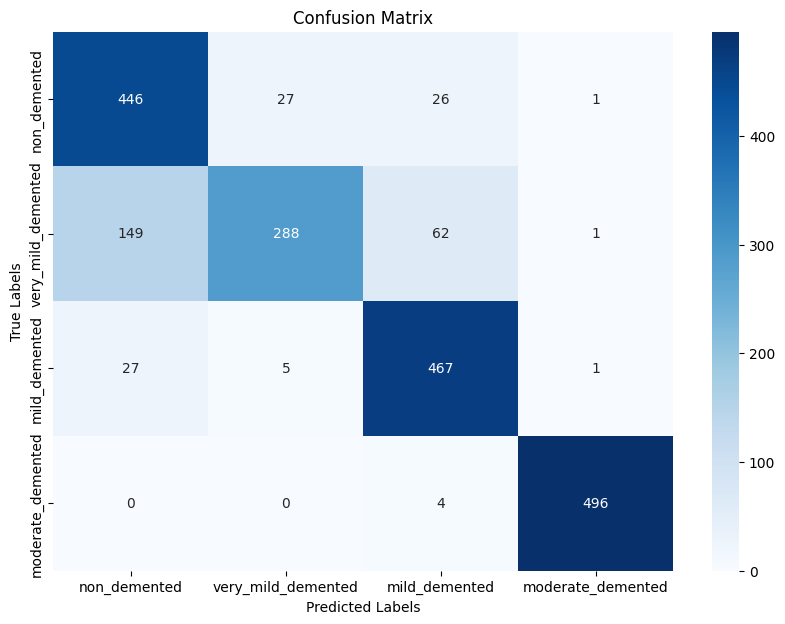

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Load the best model
model_path = '/content/drive/MyDrive/MobileNet.h5'
alexnet_model = load_model(model_path)

# Predict on the test set
y_pred = alexnet_model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Calculate accuracy
accuracy = accuracy_score(y_test_classes, y_pred_classes)

# Generate classification report
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names, output_dict=True)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

# Print overall results
print("Overall Accuracy: {:.2f}".format(accuracy))

# Print confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Print classification report
print("\nClassification Report:")
for class_name, metrics in report.items():
    if isinstance(metrics, dict):  # Only print metrics for classes
        print(f"{class_name}: Precision = {metrics['precision']:.2f}, Recall = {metrics['recall']:.2f}, F1 Score = {metrics['f1-score']:.2f}")

# Calculate mean F1 Score
f1_scores = [metrics['f1-score'] for class_name, metrics in report.items() if isinstance(metrics, dict) and 'f1-score' in metrics]
mean_f1_score = np.mean(f1_scores)
print("Mean F1 Score: {:.2f}".format(mean_f1_score))

# Calculate overall precision, recall, and F1 Score
overall_precision = report['accuracy']  # 'accuracy' is actually overall accuracy
overall_recall = report['accuracy']     # 'accuracy' is actually overall accuracy
overall_f1_score = mean_f1_score

# Print overall metrics
print("\nOverall Metrics:")
print(f"Overall Precision: {overall_precision:.2f}")
print(f"Overall Recall: {overall_recall:.2f}")
print(f"Overall F1 Score: {overall_f1_score:.2f}")

# Visualization of the Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

LeNet

In [ ]:
# Define the model architecture (LeNet)
model_lenet = Sequential([
    Conv2D(6, (5, 5), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(16, (5, 5), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(120, activation='relu'),
    Dense(84, activation='relu'),
    Dense(4, activation='softmax')  # 4 classes in the output layer
])

In [ ]:
# Compile the model
model_lenet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from tensorflow.keras import Model

# Assuming you want the output of the last Dense layer in 'model_lenet'
output_layer = model_lenet.layers[-1].output

# Create the Functional model
model_lenet = Model(inputs=model_lenet.input, outputs=output_layer)

# Compile the model after it's fully constructed
model_lenet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Splitting data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(data, result, test_size=0.20, shuffle=True, random_state=42)

# Training the model with the validation set
history_lenet = model_lenet.fit(x_train, y_train, epochs=50, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/50
250/250 [==============================] - 13s 50ms/step - loss: 3.2021 - accuracy: 0.6957 - val_loss: 0.5480 - val_accuracy: 0.7570
Epoch 2/50
250/250 [==============================] - 12s 49ms/step - loss: 0.2093 - accuracy: 0.9219 - val_loss: 0.2126 - val_accuracy: 0.9140
Epoch 3/50
250/250 [==============================] - 12s 48ms/step - loss: 0.0862 - accuracy: 0.9703 - val_loss: 0.1408 - val_accuracy: 0.9480
Epoch 4/50
250/250 [==============================] - 13s 50ms/step - loss: 0.0451 - accuracy: 0.9854 - val_loss: 0.1346 - val_accuracy: 0.9565
Epoch 5/50
250/250 [==============================] - 12s 49ms/step - loss: 0.0294 - accuracy: 0.9894 - val_loss: 0.2801 - val_accuracy: 0.9350
Epoch 6/50
250/250 [==============================] - 12s 48ms/step - loss: 0.0489 - accuracy: 0.9826 - val_loss: 0.3580 - val_accuracy: 0.9185
Epoch 7/50
250/250 [==============================] - 12s 49ms/step - loss: 0.0355 - accuracy: 0.9874 - val_loss: 0.1713 - val_accuracy:

In [ ]:
# Evaluate the model on the test set
test_loss_lenet, test_accuracy_lenet = model_lenet.evaluate(data_test, result_test)

63/63 [==============================] - 1s 9ms/step - loss: 0.1802 - accuracy: 0.9490


In [ ]:
print(f"LeNet Test Accuracy: {test_accuracy_lenet}, Test Loss: {test_loss_lenet}")

LeNet Test Accuracy: 0.9490000009536743, Test Loss: 0.1802355796098709


In [ ]:
model_lenet.save("/content/drive/MyDrive/model_lenet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



63/63 [==============================] - 1s 9ms/step
Overall Accuracy: 0.95

Confusion Matrix:
[[464  23  13   0]
 [ 46 437  17   0]
 [  3   0 497   0]
 [  0   0   0 500]]

Classification Report:
non_demented: Precision = 0.90, Recall = 0.93, F1 Score = 0.92
very_mild_demented: Precision = 0.95, Recall = 0.87, F1 Score = 0.91
mild_demented: Precision = 0.94, Recall = 0.99, F1 Score = 0.97
moderate_demented: Precision = 1.00, Recall = 1.00, F1 Score = 1.00
macro avg: Precision = 0.95, Recall = 0.95, F1 Score = 0.95
weighted avg: Precision = 0.95, Recall = 0.95, F1 Score = 0.95
Mean F1 Score: 0.95

Overall Metrics:
Overall Precision: 0.95
Overall Recall: 0.95
Overall F1 Score: 0.95


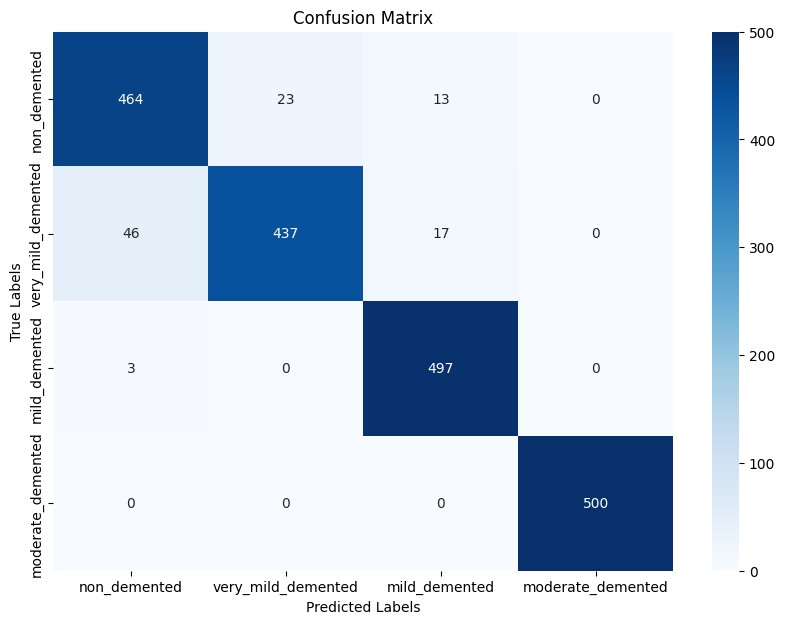

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Load the best model
model_path = '/content/drive/MyDrive/model_lenet.h5'
alexnet_model = load_model(model_path)

# Predict on the test set
y_pred = alexnet_model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Calculate accuracy
accuracy = accuracy_score(y_test_classes, y_pred_classes)

# Generate classification report
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names, output_dict=True)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

# Print overall results
print("Overall Accuracy: {:.2f}".format(accuracy))

# Print confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Print classification report
print("\nClassification Report:")
for class_name, metrics in report.items():
    if isinstance(metrics, dict):  # Only print metrics for classes
        print(f"{class_name}: Precision = {metrics['precision']:.2f}, Recall = {metrics['recall']:.2f}, F1 Score = {metrics['f1-score']:.2f}")

# Calculate mean F1 Score
f1_scores = [metrics['f1-score'] for class_name, metrics in report.items() if isinstance(metrics, dict) and 'f1-score' in metrics]
mean_f1_score = np.mean(f1_scores)
print("Mean F1 Score: {:.2f}".format(mean_f1_score))

# Calculate overall precision, recall, and F1 Score
overall_precision = report['accuracy']  # 'accuracy' is actually overall accuracy
overall_recall = report['accuracy']     # 'accuracy' is actually overall accuracy
overall_f1_score = mean_f1_score

# Print overall metrics
print("\nOverall Metrics:")
print(f"Overall Precision: {overall_precision:.2f}")
print(f"Overall Recall: {overall_recall:.2f}")
print(f"Overall F1 Score: {overall_f1_score:.2f}")

# Visualization of the Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

UNET

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, UpSampling2D, Input, concatenate, Flatten, Dense

In [ ]:
# Define the model architecture (simplified U-Net)
def create_unet(input_shape):
    inputs = Input(input_shape)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    flat = Flatten()(pool2)
    dense1 = Dense(128, activation='relu')(flat)
    outputs = Dense(4, activation='softmax')(dense1)  # 4 classes in the output layer

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [ ]:
# Create U-Net model
model_unet = create_unet(input_shape=(128, 128, 3))

In [ ]:
# compile the model
model_unet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, UpSampling2D, Input, concatenate, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Define the model architecture (simplified U-Net)
def create_unet(input_shape):
    inputs = Input(input_shape)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    flat = Flatten()(pool2)
    dense1 = Dense(128, activation='relu')(flat)
    outputs = Dense(4, activation='softmax')(dense1)  # 4 classes in the output layer

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

# Create U-Net model
model_unet = create_unet(input_shape=(128, 128, 3))

# Access the output of the last layer within the SAME model instance
predictions = model_unet.layers[-1].output

# No need to create a new Model instance here. Just use the existing one.
# model_unet = Model(inputs=base_module.input, outputs=predictions)

# Compile the model
model_unet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Instantiate an EarlyStopping object
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Assuming 'data' and 'result' are your input data and labels, respectively
# Splitting data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(data, result, test_size=0.20, shuffle=True, random_state=42)

# Training the model with the validation set
history_unet = model_unet.fit(x_train, y_train, epochs=50, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/50
250/250 [==============================] - 30s 119ms/step - loss: 16.6948 - accuracy: 0.6998 - val_loss: 0.3575 - val_accuracy: 0.8445
Epoch 2/50
250/250 [==============================] - 31s 123ms/step - loss: 0.2036 - accuracy: 0.9241 - val_loss: 0.2641 - val_accuracy: 0.8955
Epoch 3/50
250/250 [==============================] - 31s 122ms/step - loss: 0.0893 - accuracy: 0.9682 - val_loss: 0.1832 - val_accuracy: 0.9370
Epoch 4/50
250/250 [==============================] - 31s 124ms/step - loss: 0.0389 - accuracy: 0.9865 - val_loss: 0.1568 - val_accuracy: 0.9555
Epoch 5/50
250/250 [==============================] - 31s 123ms/step - loss: 0.0239 - accuracy: 0.9933 - val_loss: 0.3045 - val_accuracy: 0.9080
Epoch 6/50
250/250 [==============================] - 30s 121ms/step - loss: 0.1140 - accuracy: 0.9622 - val_loss: 0.2402 - val_accuracy: 0.9285
Epoch 7/50
250/250 [==============================] - 30s 121ms/step - loss: 0.0251 - accuracy: 0.9908 - val_loss: 0.1497 - val_a

In [ ]:
# Evaluate the model on the test set
test_loss_unet, test_accuracy_unet = model_unet.evaluate(data_test, result_test)

63/63 [==============================] - 2s 29ms/step - loss: 0.2573 - accuracy: 0.9485


In [ ]:
print(f"U-Net Test Accuracy: {test_accuracy_unet}, Test Loss: {test_loss_unet}")

U-Net Test Accuracy: 0.9484999775886536, Test Loss: 0.25728991627693176


In [ ]:
model_unet.save("/content/drive/MyDrive/model_unet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



63/63 [==============================] - 2s 29ms/step
Overall Accuracy: 0.95

Confusion Matrix:
[[420  57  23   0]
 [  8 487   5   0]
 [  6   4 490   0]
 [  0   0   0 500]]

Classification Report:
non_demented: Precision = 0.97, Recall = 0.84, F1 Score = 0.90
very_mild_demented: Precision = 0.89, Recall = 0.97, F1 Score = 0.93
mild_demented: Precision = 0.95, Recall = 0.98, F1 Score = 0.96
moderate_demented: Precision = 1.00, Recall = 1.00, F1 Score = 1.00
macro avg: Precision = 0.95, Recall = 0.95, F1 Score = 0.95
weighted avg: Precision = 0.95, Recall = 0.95, F1 Score = 0.95
Mean F1 Score: 0.95

Overall Metrics:
Overall Precision: 0.95
Overall Recall: 0.95
Overall F1 Score: 0.95


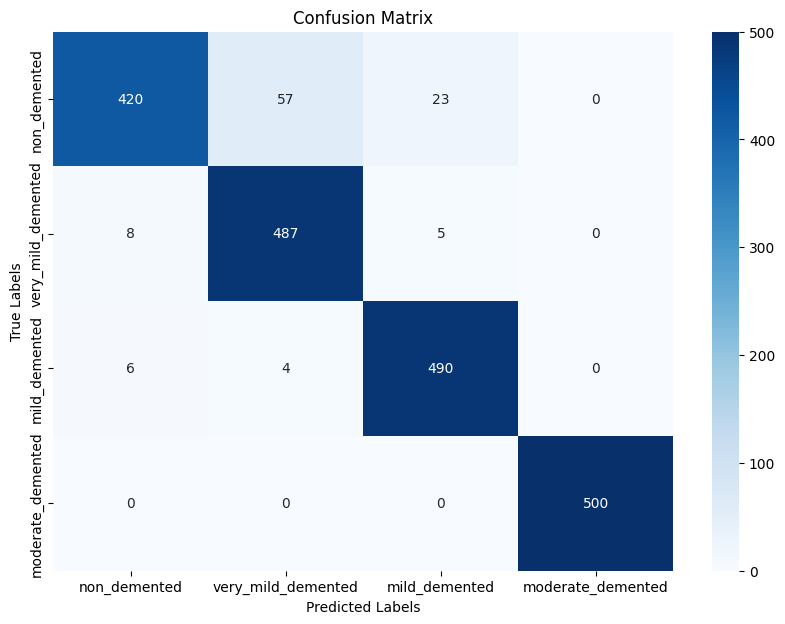

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Load the best model
model_path = '/content/drive/MyDrive/model_unet.h5'
alexnet_model = load_model(model_path)

# Predict on the test set
y_pred = alexnet_model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Calculate accuracy
accuracy = accuracy_score(y_test_classes, y_pred_classes)

# Generate classification report
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names, output_dict=True)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

# Print overall results
print("Overall Accuracy: {:.2f}".format(accuracy))

# Print confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Print classification report
print("\nClassification Report:")
for class_name, metrics in report.items():
    if isinstance(metrics, dict):  # Only print metrics for classes
        print(f"{class_name}: Precision = {metrics['precision']:.2f}, Recall = {metrics['recall']:.2f}, F1 Score = {metrics['f1-score']:.2f}")

# Calculate mean F1 Score
f1_scores = [metrics['f1-score'] for class_name, metrics in report.items() if isinstance(metrics, dict) and 'f1-score' in metrics]
mean_f1_score = np.mean(f1_scores)
print("Mean F1 Score: {:.2f}".format(mean_f1_score))

# Calculate overall precision, recall, and F1 Score
overall_precision = report['accuracy']  # 'accuracy' is actually overall accuracy
overall_recall = report['accuracy']     # 'accuracy' is actually overall accuracy
overall_f1_score = mean_f1_score

# Print overall metrics
print("\nOverall Metrics:")
print(f"Overall Precision: {overall_precision:.2f}")
print(f"Overall Recall: {overall_recall:.2f}")
print(f"Overall F1 Score: {overall_f1_score:.2f}")

# Visualization of the Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

EfficientNet

In [ ]:
from tensorflow.keras.applications import EfficientNetB0

# Create EfficientNetB0 model
model_efficientnet = EfficientNetB0(input_shape=(128, 128, 3), weights=None, classes=4)

In [ ]:
# Compile the model
model_efficientnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, UpSampling2D, Input, concatenate, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Define the model architecture (simplified U-Net)
def create_efficientnet(input_shape):
    inputs = Input(input_shape)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    flat = Flatten()(pool2)
    dense1 = Dense(128, activation='relu')(flat)
    outputs = Dense(4, activation='softmax')(dense1)  # 4 classes in the output layer

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

# Create U-Net model
model_efficientnet = create_efficientnet(input_shape=(128, 128, 3))

# Access the output of the last layer within the SAME model instance
predictions = model_efficientnet.layers[-1].output

# No need to create a new Model instance here. Just use the existing one.
# model_efficientnet = Model(inputs=base_module.input, outputs=predictions)

# Compile the model
model_efficientnet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Instantiate an EarlyStopping object
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Assuming 'data' and 'result' are your input data and labels, respectively
# Splitting data into train and validation sets
x_train, x_val, y_train, y_val = train_test_split(data, result, test_size=0.20, shuffle=True, random_state=42)

# Training the model with the validation set
history_efficientnet = model_efficientnet.fit(x_train, y_train, epochs=50, validation_data=(x_val, y_val), callbacks=[early_stopping])

Epoch 1/50
250/250 [==============================] - 31s 121ms/step - loss: 12.6902 - accuracy: 0.7182 - val_loss: 0.3716 - val_accuracy: 0.8635
Epoch 2/50
250/250 [==============================] - 31s 123ms/step - loss: 0.1672 - accuracy: 0.9389 - val_loss: 0.1644 - val_accuracy: 0.9415
Epoch 3/50
250/250 [==============================] - 31s 123ms/step - loss: 0.0784 - accuracy: 0.9741 - val_loss: 0.1879 - val_accuracy: 0.9400
Epoch 4/50
250/250 [==============================] - 31s 124ms/step - loss: 0.0510 - accuracy: 0.9822 - val_loss: 0.1089 - val_accuracy: 0.9565
Epoch 5/50
250/250 [==============================] - 31s 122ms/step - loss: 0.0624 - accuracy: 0.9804 - val_loss: 0.3431 - val_accuracy: 0.8770
Epoch 6/50
250/250 [==============================] - 31s 124ms/step - loss: 0.0981 - accuracy: 0.9656 - val_loss: 0.1320 - val_accuracy: 0.9545
Epoch 7/50
250/250 [==============================] - 32s 128ms/step - loss: 0.0239 - accuracy: 0.9920 - val_loss: 0.1583 - val_a

In [ ]:
# Evaluate the model on the test set
test_loss_efficientnet, test_accuracy_efficientnet = model_efficientnet.evaluate(data_test, result_test)

63/63 [==============================] - 2s 36ms/step - loss: 0.1791 - accuracy: 0.9440


In [ ]:
print(f"Efficient-Net Test Accuracy: {test_accuracy_efficientnet}, Test Loss: {test_loss_efficientnet}")

Efficient-Net Test Accuracy: 0.9440000057220459, Test Loss: 0.17908403277397156


In [ ]:
model_efficientnet.save("/content/drive/MyDrive/model_efficientnet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



63/63 [==============================] - 2s 31ms/step
Overall Accuracy: 0.94

Confusion Matrix:
[[433  45  22   0]
 [ 30 459  11   0]
 [  3   1 496   0]
 [  0   0   0 500]]

Classification Report:
non_demented: Precision = 0.93, Recall = 0.87, F1 Score = 0.90
very_mild_demented: Precision = 0.91, Recall = 0.92, F1 Score = 0.91
mild_demented: Precision = 0.94, Recall = 0.99, F1 Score = 0.96
moderate_demented: Precision = 1.00, Recall = 1.00, F1 Score = 1.00
macro avg: Precision = 0.94, Recall = 0.94, F1 Score = 0.94
weighted avg: Precision = 0.94, Recall = 0.94, F1 Score = 0.94
Mean F1 Score: 0.94

Overall Metrics:
Overall Precision: 0.94
Overall Recall: 0.94
Overall F1 Score: 0.94


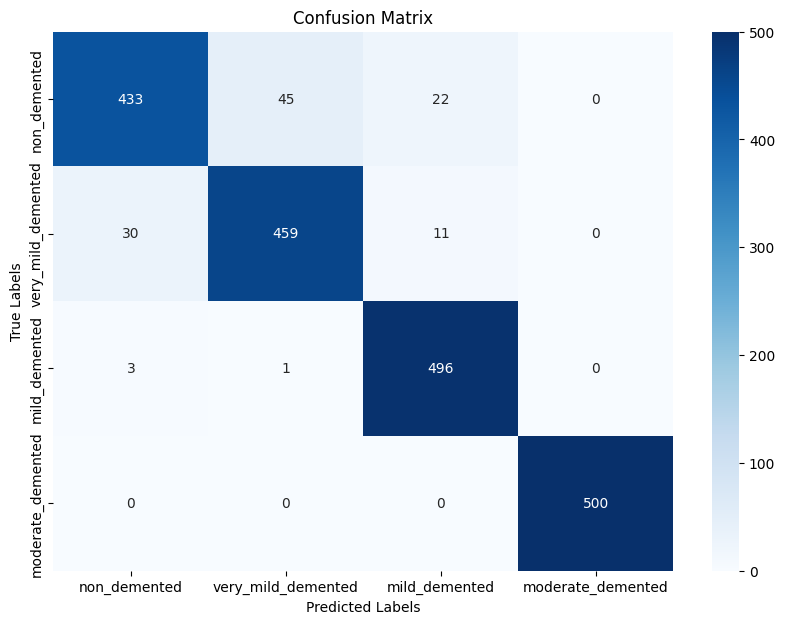

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Load the best model
model_path = '/content/drive/MyDrive/model_efficientnet.h5'
alexnet_model = load_model(model_path)

# Predict on the test set
y_pred = alexnet_model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Calculate accuracy
accuracy = accuracy_score(y_test_classes, y_pred_classes)

# Generate classification report
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names, output_dict=True)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

# Print overall results
print("Overall Accuracy: {:.2f}".format(accuracy))

# Print confusion matrix
print("\nConfusion Matrix:")
print(conf_matrix)

# Print classification report
print("\nClassification Report:")
for class_name, metrics in report.items():
    if isinstance(metrics, dict):  # Only print metrics for classes
        print(f"{class_name}: Precision = {metrics['precision']:.2f}, Recall = {metrics['recall']:.2f}, F1 Score = {metrics['f1-score']:.2f}")

# Calculate mean F1 Score
f1_scores = [metrics['f1-score'] for class_name, metrics in report.items() if isinstance(metrics, dict) and 'f1-score' in metrics]
mean_f1_score = np.mean(f1_scores)
print("Mean F1 Score: {:.2f}".format(mean_f1_score))

# Calculate overall precision, recall, and F1 Score
overall_precision = report['accuracy']  # 'accuracy' is actually overall accuracy
overall_recall = report['accuracy']     # 'accuracy' is actually overall accuracy
overall_f1_score = mean_f1_score

# Print overall metrics
print("\nOverall Metrics:")
print(f"Overall Precision: {overall_precision:.2f}")
print(f"Overall Recall: {overall_recall:.2f}")
print(f"Overall F1 Score: {overall_f1_score:.2f}")

# Visualization of the Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()